# Časové řady ve formě Prezentace - Bc. Adéla Leppeltová
***

## Popis výzkumného souboru

Dataset uvádí hodinové údaje o spotřebě elektřiny pocházejí z internetových stránek PJM a jsou uvedeny v megawattech (MW). Data jsou od října 2004 do srpna 2018.

Dataset obsahuje 2 sloupce a 121 273 řádků.

[Odkaz na dataset](https://www.kaggle.com/datasets/robikscube/hourly-energy-consumption/data?select=AEP_hourly.csv)

Pozn.: PJM Interconnection LLC je přenosová organizace v USA



In [111]:
import pandas as pd
import numpy as np                  
import math
import matplotlib.pyplot as plt         
import matplotlib as mpl
import seaborn as sns

# Načtení dat ze souboru
data = pd.read_csv("AEP_hourly.csv")

# Zobrazení prvních pár řádků dat
print(data.head())
print()

              Datetime   AEP_MW
0  2004-12-31 01:00:00  13478.0
1  2004-12-31 02:00:00  12865.0
2  2004-12-31 03:00:00  12577.0
3  2004-12-31 04:00:00  12517.0
4  2004-12-31 05:00:00  12670.0



## Výzkumné otázky

1. Jak se mění průměrná spotřeba energie během dne?
2. Existují rozdíly ve spotřebě energie mezi jednotlivými měsíci?
3. Existuje v časové řadě spotřeby energie autokorelace?


## Missing values
Dataset neobsahuje žádné chybějící hodnoty.

In [22]:
missing_values = data.isnull().sum()
print("Chybějící hodnoty:")
print(missing_values)

Chybějící hodnoty:
Datetime    0
AEP_MW      0
dtype: int64


## Duplicity

In [115]:
# Kontrola duplicit
duplicates = data.duplicated().sum()

if duplicates == 0:
    print("V datasetu nejsou žádné duplicity.")
else:
    print(f"V datasetu jsou {duplicates} duplicity.")


V datasetu nejsou žádné duplicity.


## Rozsah hodnot a typy dat

In [117]:
# Rozsah hodnot
min_value = data.min()
max_value = data.max()
print("\nMinimální hodnota:")
print(min_value)
print("\nMaximální hodnota:")
print(max_value)

# Kontrola typů dat
data_types = data.dtypes
print("\nTypy dat:")
print(data_types)



Minimální hodnota:
Datetime    2004-10-01 01:00:00
AEP_MW                   9581.0
Hour                          0
Month                         1
dtype: object

Maximální hodnota:
Datetime    2018-08-03 00:00:00
AEP_MW                  25695.0
Hour                         23
Month                        12
dtype: object

Typy dat:
Datetime    datetime64[ns]
AEP_MW             float64
Hour                 int32
Month                int32
dtype: object


## Základní statistiky

In [23]:
print("Základní statistiky:")
print(data.describe())

Základní statistiky:
              AEP_MW
count  121273.000000
mean    15499.513717
std      2591.399065
min      9581.000000
25%     13630.000000
50%     15310.000000
75%     17200.000000
max     25695.000000


## Jak se mění průměrná spotřeba energie během dne?

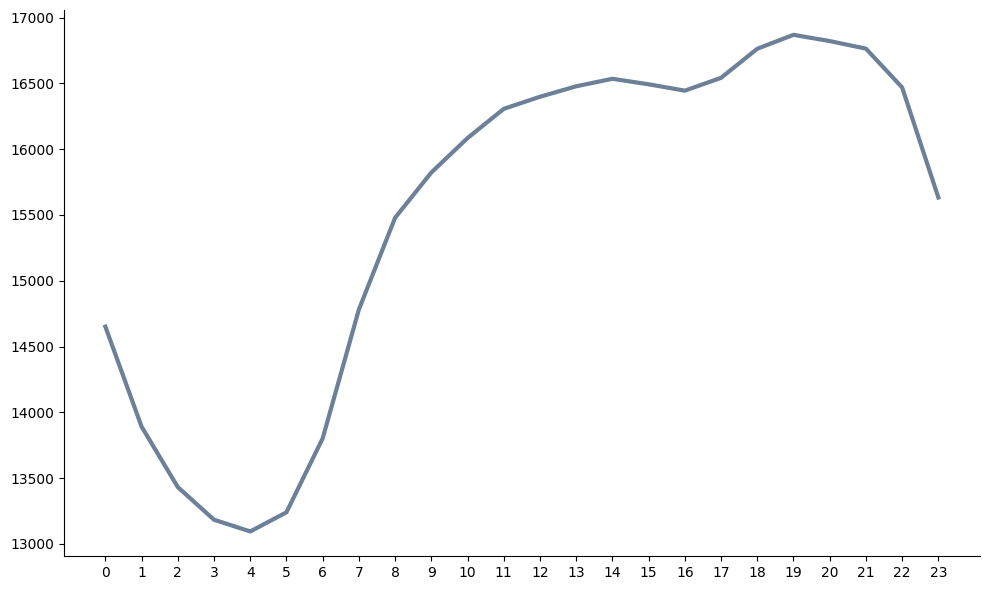

In [144]:
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Hour'] = data['Datetime'].dt.hour

mean_energy_by_hour = data.groupby('Hour')['AEP_MW'].mean()

plt.figure(figsize=(10, 6))
mean_energy_by_hour.plot(marker='', linewidth=3, linestyle='-', color="#6C8098")

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.xticks(range(24))
plt.tight_layout()
plt.show()


## Existují rozdíly ve spotřebě energie mezi jednotlivými měsíci?

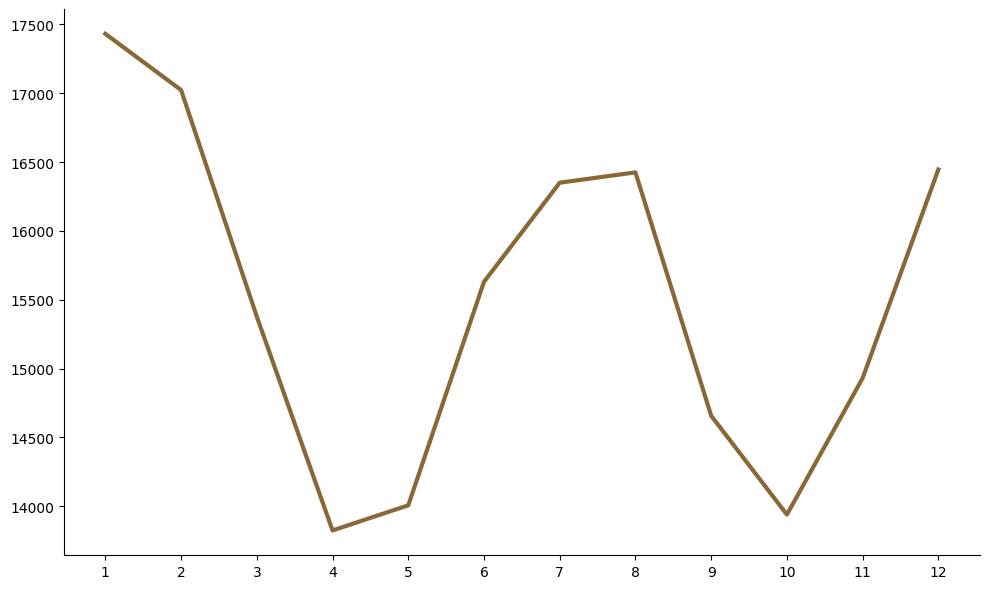

In [146]:
# Převod sloupce 'Datetime' na datový typ datetime
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Hour'] = data['Datetime'].dt.hour

# Analýza sezónních trendů
data['Month'] = data['Datetime'].dt.month

mean_energy_by_month = data.groupby('Month')['AEP_MW'].mean()

plt.figure(figsize=(10, 6))
mean_energy_by_month.plot(marker='', linestyle='-', linewidth=3, color="#886837")
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.xlabel('')
plt.ylabel('')
plt.grid(False)
plt.xticks(range(1, 13))
plt.tight_layout()
plt.show()

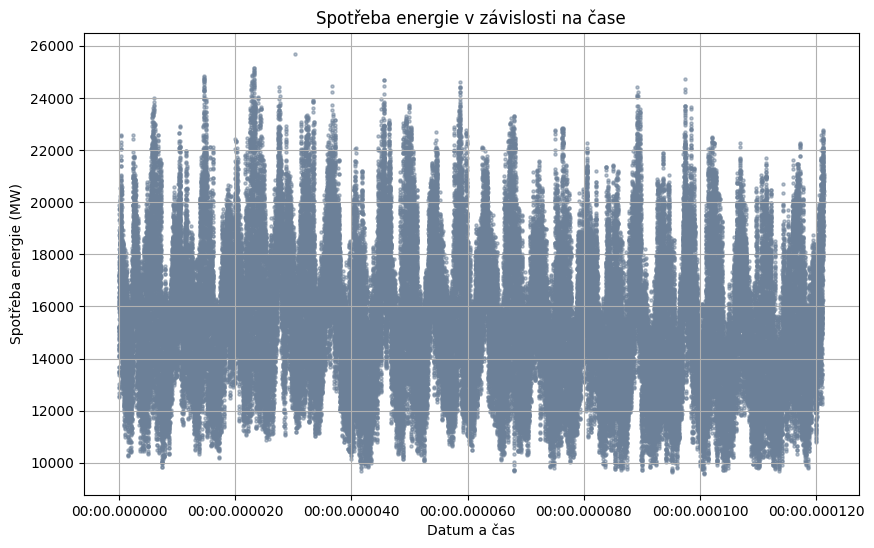

In [128]:
import matplotlib.pyplot as plt

# Vytvoření scatter plotu
plt.figure(figsize=(10, 6))
plt.scatter(data.index, data['AEP_MW'], s=5, alpha=0.5, color='#6C8098')
plt.title('Spotřeba energie v závislosti na čase')
plt.xlabel('Datum a čas')
plt.ylabel('Spotřeba energie (MW)')
plt.grid(True)
plt.show()


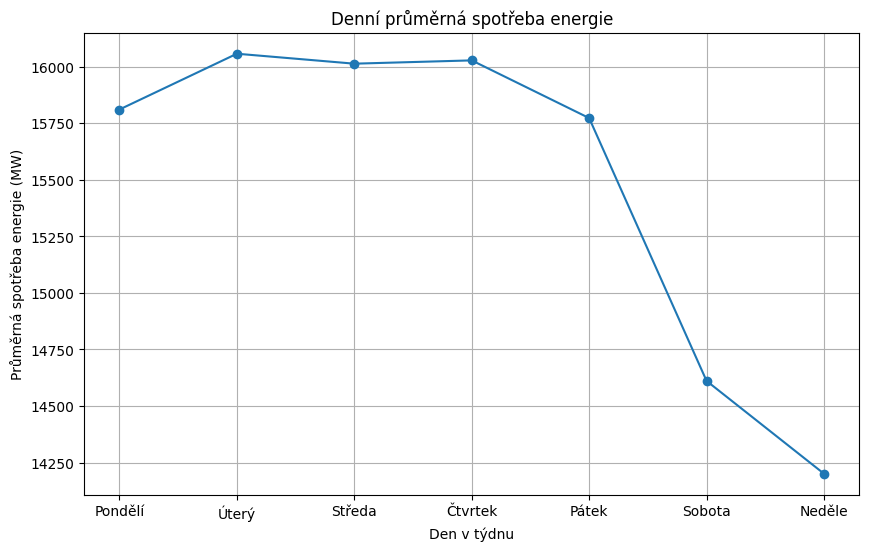

In [45]:
# Denní průměrná spotřeba energie
mean_energy_by_day = data.groupby(data.index.dayofweek)['AEP_MW'].mean()

# Nastavení názvů dnů v týdnu
days_of_week = ['Pondělí', 'Úterý', 'Středa', 'Čtvrtek', 'Pátek', 'Sobota', 'Neděle']

plt.figure(figsize=(10, 6))
mean_energy_by_day.plot(marker='o', linestyle='-')
plt.title('Denní průměrná spotřeba energie')
plt.xlabel('Den v týdnu')
plt.ylabel('Průměrná spotřeba energie (MW)')
plt.grid(True)
plt.xticks(range(7), days_of_week)
plt.show()


## Existuje v časové řadě spotřeby energie autokorelace?

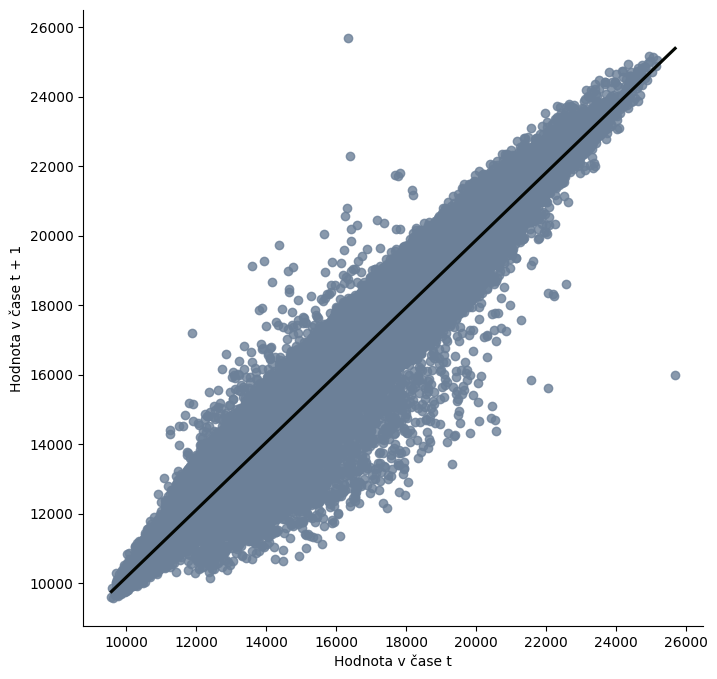

In [148]:
lag = 1

data['AEP_MW_lagged'] = data['AEP_MW'].shift(lag)

plt.figure(figsize=(8, 8))
sns.regplot(x='AEP_MW_lagged', y='AEP_MW', data=data, scatter_kws={'color': '#6C8098'}, line_kws={'color': '#030602'}, scatter=True, ci=None)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.xlabel('Hodnota v čase t')
plt.ylabel('Hodnota v čase t + 1')
plt.grid(False)
plt.show()


In [118]:
import plotly.express as px

# Nainstalování knihovny Plotly, pokud ještě není nainstalována

# Importování knihovny Plotly
import plotly.graph_objects as go

# Vytvoření grafu
fig = go.Figure()

# Přidání časové řady spotřeby energie
fig.add_trace(go.Scatter(x=data.index, y=data['AEP_MW'], mode='lines', name='Spotřeba energie'))

# Nastavení popisků os a titulu
fig.update_layout(title='Časový řadový graf spotřeby energie',
                   xaxis_title='Datum',
                   yaxis_title='Spotřeba energie (MW)')

# Zobrazení grafu
fig.show()


In [121]:
import plotly.express as px

# Vytvoření heatmapy
fig = px.imshow(data[['AEP_MW']], 
                labels={'x':'Datum', 'y':'Hodina', 'color':'Spotřeba energie (MW)'}, 
                title='Heatmapa spotřeby energie')

# Zobrazení grafu
fig.show()


In [125]:
import plotly.express as px

# Vytvoření sloupcového grafu
fig = px.bar(data, x=data.index, y='AEP_MW', 
             labels={'x':'Datum', 'y':'Spotřeba energie (MW)'}, 
             title='Sloupcový graf spotřeby energie')

# Zobrazení grafu
fig.show()
